# Table of Contents
 <p><div class="lev1 toc-item"><a href="#Utility-Functions" data-toc-modified-id="Utility-Functions-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Utility Functions</a></div><div class="lev1 toc-item"><a href="#Building-a-Convolutional-Neural-Network" data-toc-modified-id="Building-a-Convolutional-Neural-Network-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Building a Convolutional Neural Network</a></div><div class="lev2 toc-item"><a href="#Model-Definition" data-toc-modified-id="Model-Definition-21"><span class="toc-item-num">2.1&nbsp;&nbsp;</span>Model Definition</a></div><div class="lev2 toc-item"><a href="#Data-Generator" data-toc-modified-id="Data-Generator-22"><span class="toc-item-num">2.2&nbsp;&nbsp;</span>Data Generator</a></div><div class="lev2 toc-item"><a href="#Training" data-toc-modified-id="Training-23"><span class="toc-item-num">2.3&nbsp;&nbsp;</span>Training</a></div><div class="lev2 toc-item"><a href="#Data-Augmentation" data-toc-modified-id="Data-Augmentation-24"><span class="toc-item-num">2.4&nbsp;&nbsp;</span>Data Augmentation</a></div><div class="lev1 toc-item"><a href="#Visualizing-Feature-Maps" data-toc-modified-id="Visualizing-Feature-Maps-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Visualizing Feature Maps</a></div><div class="lev1 toc-item"><a href="#Dense-Layer-Visualization" data-toc-modified-id="Dense-Layer-Visualization-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Dense Layer Visualization</a></div><div class="lev1 toc-item"><a href="#Visualizing-Convnet-Filters" data-toc-modified-id="Visualizing-Convnet-Filters-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>Visualizing Convnet Filters</a></div>

In [1]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

cp: cannot stat 'kaggle.json': No such file or directory
chmod: cannot access '/root/.kaggle/kaggle.json': No such file or directory


In [2]:
!kaggle datasets download -d jhe2918/cats-and-dogs-small

Dataset URL: https://www.kaggle.com/datasets/jhe2918/cats-and-dogs-small
License(s): unknown
 95% 82.0M/86.7M [00:01<00:00, 62.0MB/s]
100% 86.7M/86.7M [00:01<00:00, 57.4MB/s]


In [3]:
!unzip cats-and-dogs-small.zip -d /content/

Archive:  cats-and-dogs-small.zip
  inflating: /content/cats_and_dogs_small/test/cats/cat.1500.jpg  
  inflating: /content/cats_and_dogs_small/test/cats/cat.1501.jpg  
  inflating: /content/cats_and_dogs_small/test/cats/cat.1502.jpg  
  inflating: /content/cats_and_dogs_small/test/cats/cat.1503.jpg  
  inflating: /content/cats_and_dogs_small/test/cats/cat.1504.jpg  
  inflating: /content/cats_and_dogs_small/test/cats/cat.1505.jpg  
  inflating: /content/cats_and_dogs_small/test/cats/cat.1506.jpg  
  inflating: /content/cats_and_dogs_small/test/cats/cat.1507.jpg  
  inflating: /content/cats_and_dogs_small/test/cats/cat.1508.jpg  
  inflating: /content/cats_and_dogs_small/test/cats/cat.1509.jpg  
  inflating: /content/cats_and_dogs_small/test/cats/cat.1510.jpg  
  inflating: /content/cats_and_dogs_small/test/cats/cat.1511.jpg  
  inflating: /content/cats_and_dogs_small/test/cats/cat.1512.jpg  
  inflating: /content/cats_and_dogs_small/test/cats/cat.1513.jpg  
  inflating: /content/cats_a

In [4]:
!pip install tensorflow
!pip install matplotlib
!pip install seaborn
!pip install pandas
!pip install numpy
!pip install pickle5  # Alternativa a pickle si es necesario
!pip install tf-keras-vis


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 132.1/132.1 kB 4.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pickle5: filename=pickle5-0.0.11-cp310-cp310-linux_x86_64.whl size=255318 sha256=41e1769ac761ba70f673ac3819f2ca0cae7ba4f2dd96f860647394f5c4c2a420
  Stored in directory: /root/.cache/pip/wheels/7d/14/ef/4aab19d27fa8e58772be5c71c16add0426acf9e1f64353235c
Successfully built pickle5
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.5/52.5 kB 1.0 MB/s eta 0:00:00


In [5]:
# Imports
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
import matplotlib.pyplot as plt
plt.style.use('ggplot')
import pandas as pd
import numpy as np
import seaborn as sns
import warnings
import os
import pickle

warnings.filterwarnings('ignore')
pd.options.display.float_format = '{:,.2f}'.format
pd.set_option('display.max_rows', 100)
pd.set_option('display.max_columns', 200)

from tensorflow.keras.models import Model, Sequential, load_model
from tensorflow.keras.layers import Dense, Input, Conv2D, MaxPooling2D, Flatten, Dropout
from tensorflow.keras.datasets import mnist
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications import VGG16
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras import backend as K

# Visualización de activaciones (puede que necesites instalar keras-vis, aunque ha sido descontinuado)
# Puedes probar con tf-keras-vis como alternativa
from tf_keras_vis.utils.model_modifiers import ReplaceToLinear
from tf_keras_vis.utils.scores import CategoricalScore
from tf_keras_vis.activation_maximization import ActivationMaximization
from tf_keras_vis.utils.input_modifiers import Jitter
from tensorflow.keras import activations

"""from vis.utils import utils
from keras import activations
from vis.visualization import visualize_activation, get_num_filters
from vis.input_modifiers import Jitter
"""

'from vis.utils import utils\nfrom keras import activations\nfrom vis.visualization import visualize_activation, get_num_filters\nfrom vis.input_modifiers import Jitter\n'

# Utility Functions

In [6]:
def smooth_curve(points, factor=0.8):
    smoothed = []
    for point in points:
        if smoothed:
            previous = smoothed[-1]
            smoothed.append(previous * factor + point * (1 - factor))
        else:
            smoothed.append(point)
    return smoothed

def plot_compare(history, steps=-1):
    if steps < 0:
        steps = len(history.history['acc'])
    acc = smooth_curve(history.history['acc'][:steps])
    val_acc = smooth_curve(history.history['val_acc'][:steps])
    loss = smooth_curve(history.history['loss'][:steps])
    val_loss = smooth_curve(history.history['val_loss'][:steps])

    plt.figure(figsize=(6, 4))
    plt.plot(loss, c='#0c7cba', label='Train Loss')
    plt.plot(val_loss, c='#0f9d58', label='Val Loss')
    plt.xticks(range(0, len(loss), 5))
    plt.xlim(0, len(loss))
    plt.title('Train Loss: %.3f, Val Loss: %.3f' % (loss[-1], val_loss[-1]), fontsize=12)
    plt.legend()

    plt.figure(figsize=(6, 4))
    plt.plot(acc, c='#0c7cba', label='Train Acc')
    plt.plot(val_acc, c='#0f9d58', label='Val Acc')
    plt.xticks(range(0, len(acc), 5))
    plt.xlim(0, len(acc))
    plt.title('Train Accuracy: %.3f, Val Accuracy: %.3f' % (acc[-1], val_acc[-1]), fontsize=12)
    plt.legend()

def deprocess_image(x):
    # normalize tensor: center on 0., ensure std is 0.1
    x -= x.mean()
    x /= (x.std() + 1e-5)
    x *= 0.1

    # clip to [0, 1]
    x += 0.5
    x = np.clip(x, 0, 1)

    # convert to RGB array
    x *= 255
    x = np.clip(x, 0, 255).astype('uint8')
    return x

def save_history(history, fn):
    with open(fn, 'wb') as fw:
        pickle.dump(history.history, fw, protocol=2)

def load_history(fn):
    class Temp():
        pass
    history = Temp()
    with open(fn, 'rb') as fr:
        history.history = pickle.load(fr)
    return history

def jitter(img, amount=32):
    ox, oy = np.random.randint(-amount, amount+1, 2)
    return np.roll(np.roll(img, ox, -1), oy, -2), ox, oy

def reverse_jitter(img, ox, oy):
    return np.roll(np.roll(img, -ox, -1), -oy, -2)

def plot_image(img):
    plt.figure(figsize=(6, 6))
    plt.imshow(img)
    plt.axis('off')

# Building a Convolutional Neural Network

## Model Definition

In [7]:
model = Sequential()
model.add(Conv2D(32, (3, 3), activation='relu', padding='same', name='conv_1',
                 input_shape=(150, 150, 3)))
model.add(MaxPooling2D((2, 2), name='maxpool_1'))
model.add(Conv2D(64, (3, 3), activation='relu', padding='same', name='conv_2'))
model.add(MaxPooling2D((2, 2), name='maxpool_2'))
model.add(Conv2D(128, (3, 3), activation='relu', padding='same', name='conv_3'))
model.add(MaxPooling2D((2, 2), name='maxpool_3'))
model.add(Conv2D(128, (3, 3), activation='relu', padding='same', name='conv_4'))
model.add(MaxPooling2D((2, 2), name='maxpool_4'))
model.add(Flatten())
model.add(Dropout(0.5))
model.add(Dense(512, activation='relu', name='dense_1'))
model.add(Dense(256, activation='relu', name='dense_2'))
model.add(Dense(1, activation='sigmoid', name='output'))

model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [8]:
base_dir = '/content/cats_and_dogs_small'
train_dir = os.path.join(base_dir, 'train')
validation_dir = os.path.join(base_dir, 'validation')
test_dir = os.path.join(base_dir, 'test')

train_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
        train_dir,
        target_size=(150, 150),
        batch_size=20,
        class_mode='binary')

validation_generator = test_datagen.flow_from_directory(
        validation_dir,
        target_size=(150, 150),
        batch_size=20,
        class_mode='binary')

Found 2000 images belonging to 2 classes.
Found 1000 images belonging to 2 classes.


## Training

In [9]:
history = model.fit(train_generator, steps_per_epoch=100, epochs=20,
                              validation_data=validation_generator, validation_steps=20, verbose=1)

Epoch 1/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - accuracy: 0.5058 - loss: 0.7080 - val_accuracy: 0.5325 - val_loss: 0.6925
Epoch 2/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.0000e+00 - loss: 0.0000e+00 - val_accuracy: 0.4875 - val_loss: 0.6935
Epoch 3/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step - accuracy: 0.5007 - loss: 0.6936 - val_accuracy: 0.4800 - val_loss: 0.6929
Epoch 4/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.0000e+00 - loss: 0.0000e+00 - val_accuracy: 0.5225 - val_loss: 0.6924
Epoch 5/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step - accuracy: 0.4894 - loss: 0.6927 - val_accuracy: 0.5200 - val_loss: 0.6930
Epoch 6/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 4s 43ms/step - accuracy: 0.0000e+00 - loss: 0.0000e+00 - val_accuracy: 0.5800 - val_loss: 0.6924
Epoch 7/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - accuracy: 0.4863 - loss: 0.6934 - val_accuracy: 0.4825 - val_loss: 0.6934
Epoch 8/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.0000e+00

In [10]:
model.save('model.keras')
save_history(history, 'history.bin')

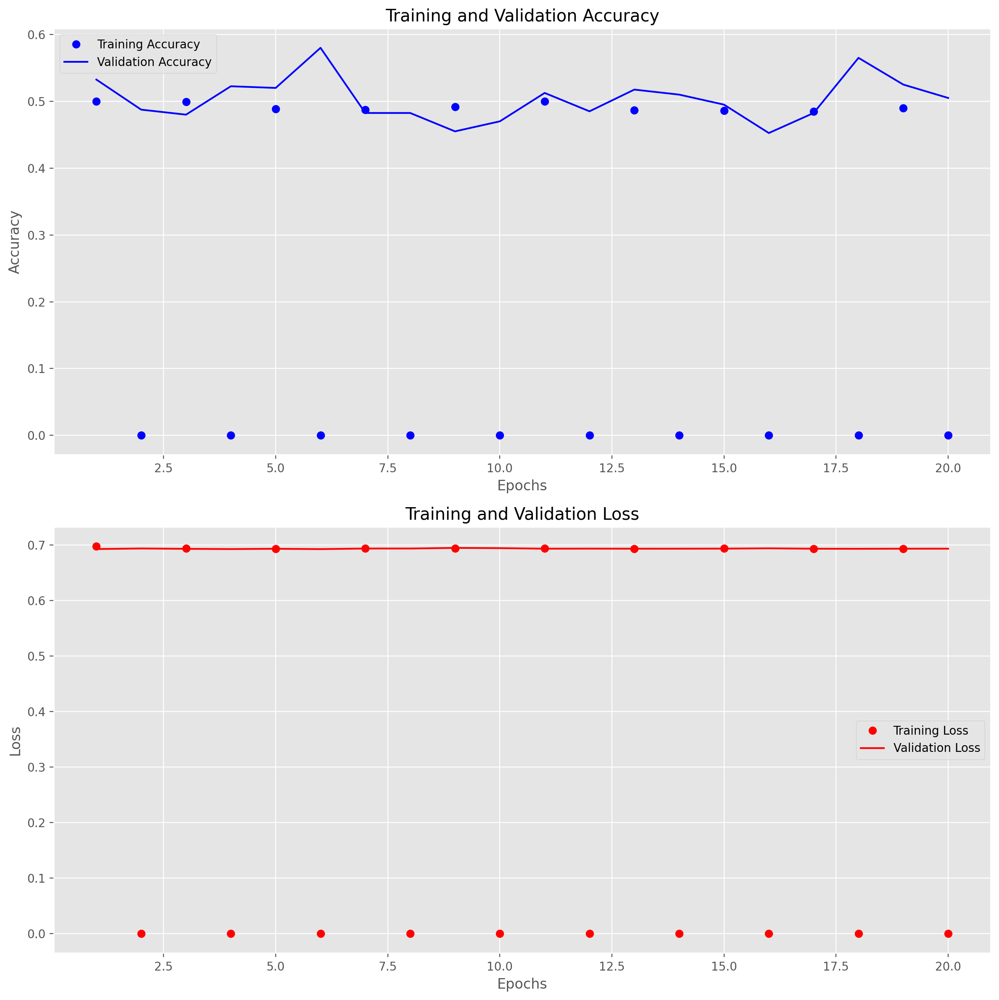

In [43]:
import matplotlib.pyplot as plt

def plot_history(history):
    # Extraer los valores de accuracy y loss
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    loss = history.history['loss']
    val_loss = history.history['val_loss']

    # Crear la gráfica
    epochs = range(1, len(acc) + 1)

    plt.figure(figsize=(12, 12))

    # Subplot 1: Precisión
    plt.subplot(2, 1, 1)
    plt.plot(epochs, acc, 'bo', label='Training Accuracy')
    plt.plot(epochs, val_acc, 'b', label='Validation Accuracy')
    plt.title('Training and Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    # Subplot 2: Pérdida
    plt.subplot(2, 1, 2)
    plt.plot(epochs, loss, 'ro', label='Training Loss')
    plt.plot(epochs, val_loss, 'r', label='Validation Loss')
    plt.title('Training and Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.tight_layout()
    plt.show()

# Cargar el historial
history = load_history('history.bin')

# Mostrar la gráfica
plot_history(history)



## Data Augmentation

In [12]:
model_aug = Sequential()
model_aug.add(Conv2D(32, (3, 3), activation='relu', padding='same', name='conv_1',
                 input_shape=(150, 150, 3)))
model_aug.add(MaxPooling2D((2, 2), name='maxpool_1'))
model_aug.add(Conv2D(64, (3, 3), activation='relu', padding='same', name='conv_2'))
model_aug.add(MaxPooling2D((2, 2), name='maxpool_2'))
model_aug.add(Conv2D(128, (3, 3), activation='relu', padding='same', name='conv_3'))
model_aug.add(MaxPooling2D((2, 2), name='maxpool_3'))
model_aug.add(Conv2D(128, (3, 3), activation='relu', padding='same', name='conv_4'))
model_aug.add(MaxPooling2D((2, 2), name='maxpool_4'))
model_aug.add(Flatten())
model_aug.add(Dropout(0.5))
model_aug.add(Dense(512, activation='relu', name='dense_1'))
model_aug.add(Dense(256, activation='relu', name='dense_2'))
model_aug.add(Dense(1, activation='sigmoid', name='output'))

In [13]:
model_aug.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [14]:
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,)

# Note that the validation data should not be augmented!
test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
        train_dir,
        target_size=(150, 150),
        batch_size=32,
        class_mode='binary')

validation_generator = test_datagen.flow_from_directory(
        validation_dir,
        target_size=(150, 150),
        batch_size=32,
        class_mode='binary')

# early_stop = EarlyStopping(monitor='val_loss', patience=6, verbose=1)
history_aug = model_aug.fit(train_generator, steps_per_epoch=100, epochs=60,
                                      validation_data=validation_generator, validation_steps=50, verbose=0)

Found 2000 images belonging to 2 classes.
Found 1000 images belonging to 2 classes.


In [15]:
model_aug.save('model_aug.keras')
save_history(history_aug, 'history_aug.bin')

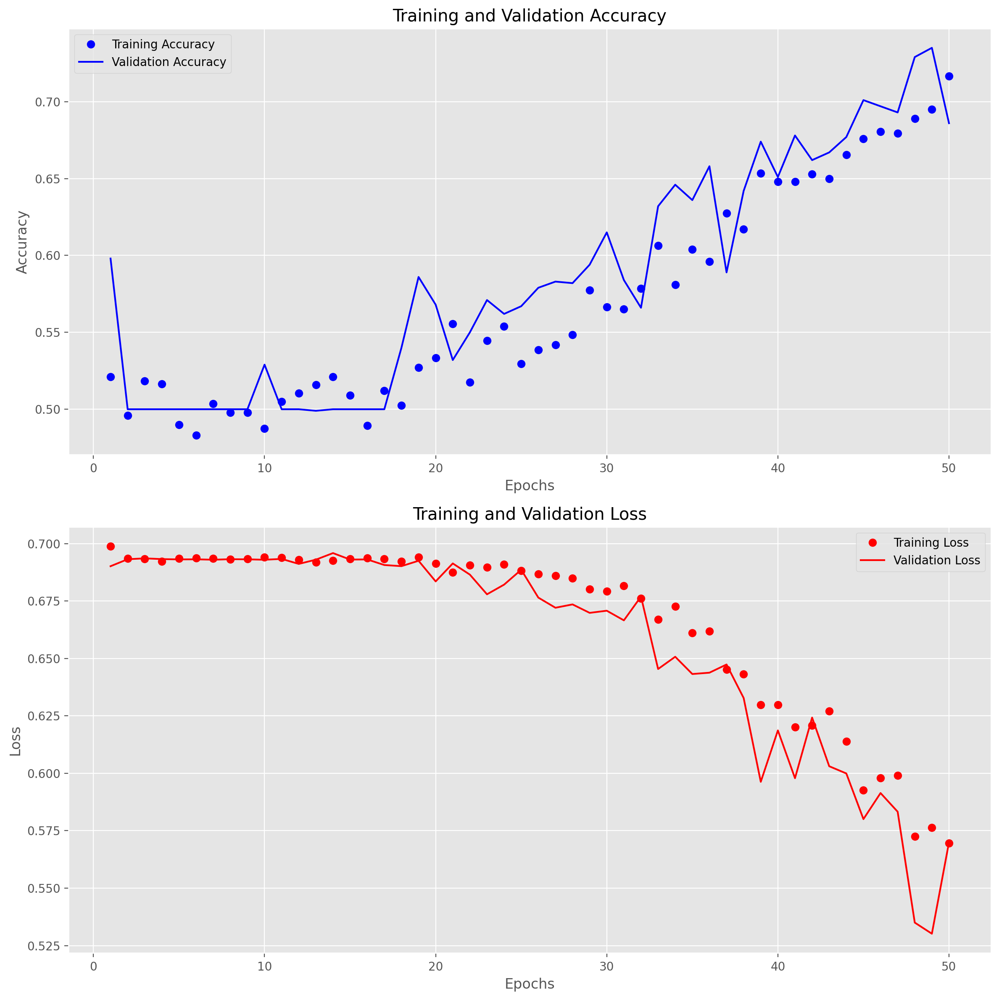

In [42]:
import matplotlib.pyplot as plt

def plot_compare(history, steps=50):
    epochs = range(1, steps + 1)
    acc = history.history['accuracy'][:steps]
    val_acc = history.history['val_accuracy'][:steps]
    loss = history.history['loss'][:steps]
    val_loss = history.history['val_loss'][:steps]

    plt.figure(figsize=(12, 12))

    # Precisión
    plt.subplot(2, 1, 1)
    plt.plot(epochs, acc, 'bo', label='Training Accuracy')
    plt.plot(epochs, val_acc, 'b', label='Validation Accuracy')
    plt.title('Training and Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    # Pérdida
    plt.subplot(2, 1, 2)
    plt.plot(epochs, loss, 'ro', label='Training Loss')
    plt.plot(epochs, val_loss, 'r', label='Validation Loss')
    plt.title('Training and Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.tight_layout()
    plt.show()

plot_compare(history_aug)



# Visualizing Feature Maps

In [35]:
img_path = '/content/cats_and_dogs_small/train/cats/cat.200.jpg'

img = image.load_img(img_path, target_size=(150, 150))
img_tensor = image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)
img_tensor /= 255.
print(img_tensor.shape)

(1, 150, 150, 3)


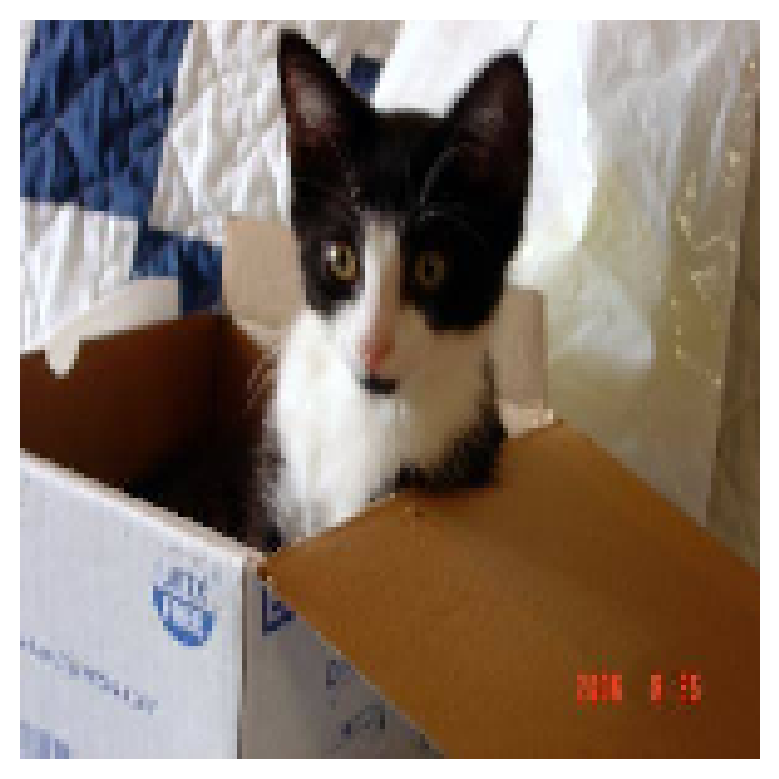

In [36]:
plt.imshow(img_tensor[0])
plt.axis('off')
plt.show()

In [37]:
vgg = VGG16(weights='imagenet', include_top=False)
vgg.summary()

Model: "vgg16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_5 (InputLayer)           │ (None, None, None, 3)       │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv1 (Conv2D)                │ (None, None, None, 64)      │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv2 (Conv2D)                │ (None, None, None, 64)      │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_pool (MaxPooling2D)           │ (None, None, None, 64)      │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv1 (Conv2D)                │ (None, None, None, 128)     │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv2 (Conv2D)                │ (None, None, None, 128)     │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_pool (MaxPooling2D)           │ (None, None, None, 128)     │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv1 (Conv2D)                │ (None, None, None, 256)     │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv2 (Conv2D)                │ (None, None, None, 256)     │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv3 (Conv2D)                │ (None, None, None, 256)     │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_pool (MaxPooling2D)           │ (None, None, None, 256)     │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv1 (Conv2D)                │ (None, None, None, 512)     │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv2 (Conv2D)                │ (None, None, None, 512)     │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv3 (Conv2D)                │ (None, None, None, 512)     │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_pool (MaxPooling2D)           │ (None, None, None, 512)     │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv1 (Conv2D)                │ (None, None, None, 512)     │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv2 (Conv2D)                │ (None, None, None, 512)     │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv3 (Conv2D)                │ (None, None, None, 512)     │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_pool (MaxPooling2D)           │ (None, None, None, 512)     │               0 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,714,688 (56.13 MB)

 Trainable params: 14,714,688 (56.13 MB)

 Non-trainable params: 0 (0.00 B)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step


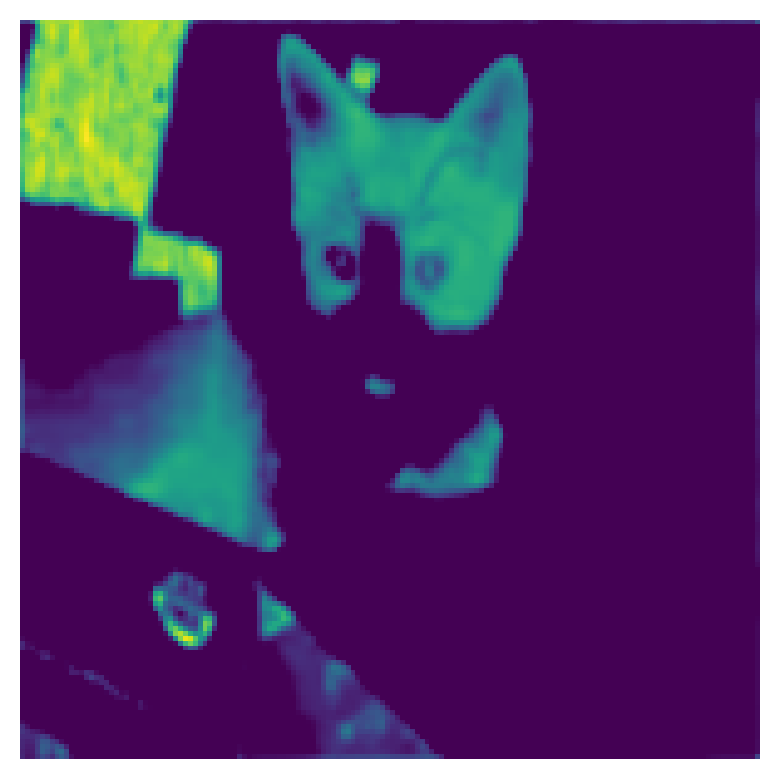

In [38]:
# Extracts the outputs of the top 8 layers:
layer_outputs = [layer.output for layer in vgg.layers if 'conv1' in layer.name]
activation_model = Model(inputs=vgg.input, outputs=layer_outputs)
intermediate_activations = activation_model.predict(img_tensor)

first_layer_activation = intermediate_activations[0]

plt.imshow(first_layer_activation[0, :, :, 19], cmap='viridis')
plt.axis('off')
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


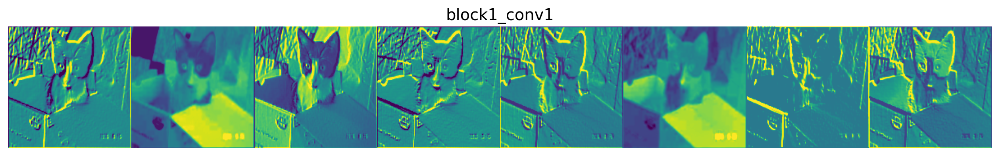

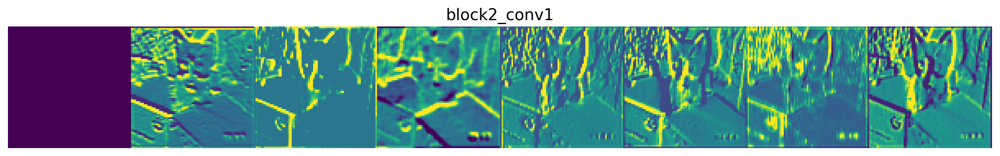

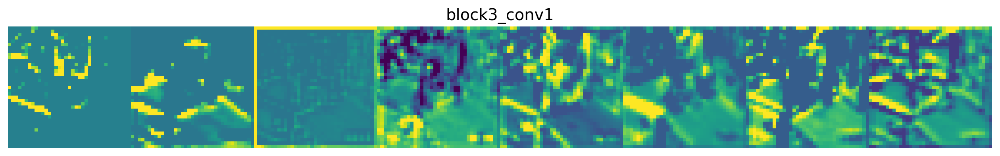

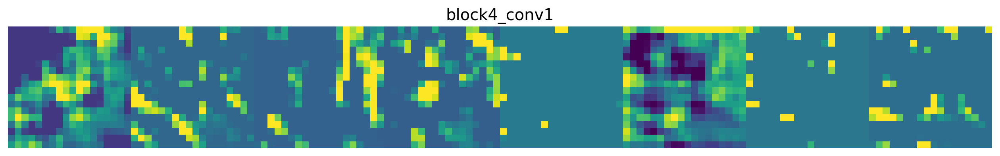

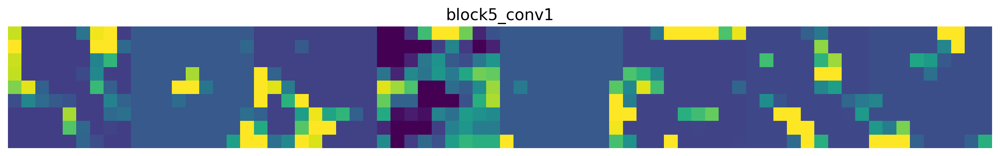

In [39]:
layer_names = ['block1_conv1', 'block2_conv1', 'block3_conv1', 'block4_conv1', 'block5_conv1']

layer_outputs = [layer.output for layer in vgg.layers if layer.name in layer_names]
activation_model = Model(inputs=vgg.input, outputs=layer_outputs)
intermediate_activations = activation_model.predict(img_tensor)

images_per_row = 8
max_images = 8
# Now let's display our feature maps
for layer_name, layer_activation in zip(layer_names, intermediate_activations):
    # This is the number of features in the feature map
    n_features = layer_activation.shape[-1]
    n_features = min(n_features, max_images)

    # The feature map has shape (1, size, size, n_features)
    size = layer_activation.shape[1]

    # We will tile the activation channels in this matrix
    n_cols = n_features // images_per_row
    display_grid = np.zeros((size * n_cols, images_per_row * size))

    # We'll tile each filter into this big horizontal grid
    for col in range(n_cols):
        for row in range(images_per_row):
            channel_image = layer_activation[0,
                                             :, :,
                                             col * images_per_row + row]
            # Post-process the feature to make it visually palatable
            channel_image -= channel_image.mean()
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size,
                         row * size : (row + 1) * size] = channel_image

    # Display the grid
    scale = 2. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.axis('off')
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')

plt.show()

# Dense Layer Visualization

In [22]:
# Construir el modelo VGG16 con pesos de ImageNet
model = VGG16(weights='imagenet', include_top=True)

# Encuentra el índice de la capa 'predictions' (última capa) y reemplaza la activación
layer_name = 'predictions'
layer_idx = [i for i, layer in enumerate(model.layers) if layer.name == layer_name][0]

# Cambiar la activación de softmax a lineal
model.layers[layer_idx].activation = activations.linear

# Verificar la modificación
print(model.summary())

553467096/553467096 ━━━━━━━━━━━━━━━━━━━━ 7s 0us/step


Model: "vgg16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)           │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv1 (Conv2D)                │ (None, 224, 224, 64)        │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv2 (Conv2D)                │ (None, 224, 224, 64)        │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_pool (MaxPooling2D)           │ (None, 112, 112, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv1 (Conv2D)                │ (None, 112, 112, 128)       │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv2 (Conv2D)                │ (None, 112, 112, 128)       │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_pool (MaxPooling2D)           │ (None, 56, 56, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv1 (Conv2D)                │ (None, 56, 56, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv2 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv3 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_pool (MaxPooling2D)           │ (None, 28, 28, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv1 (Conv2D)                │ (None, 28, 28, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv2 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv3 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_pool (MaxPooling2D)           │ (None, 14, 14, 512)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv1 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv2 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv3 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_pool (MaxPooling2D)           │ (None, 7, 7, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 25088)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ fc1 (Dense)                          │ (None, 4096)                │     102,764,544 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 138,357,544 (527.79 MB)

 Trainable params: 138,357,544 (527.79 MB)

 Non-trainable params: 0 (0.00 B)

None


In [24]:
model_modifier = ReplaceToLinear()

# Definir la categoría objetivo (en este caso, 'ouzel' que corresponde a la categoría 20 en ImageNet)
score = CategoricalScore([20])

# Inicializar la técnica de maximización de activación
activation_maximization = ActivationMaximization(model, model_modifier=model_modifier)

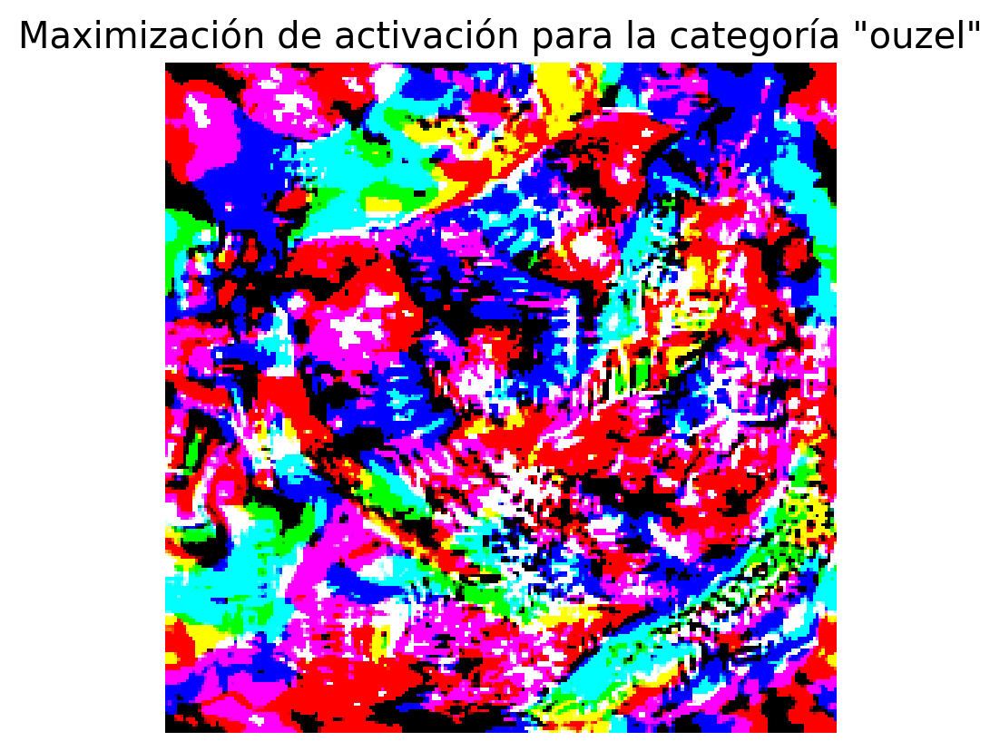

In [27]:
# Jitter 16 pixels along all dimensions to during the optimization process.
seed_input = np.random.random((1, 224, 224, 3))
img = activation_maximization(score, seed_input=seed_input)

# Mostrar la imagen generada
plt.imshow(img[0])
plt.title('Maximización de activación para la categoría "ouzel"')
plt.axis('off')
plt.show()

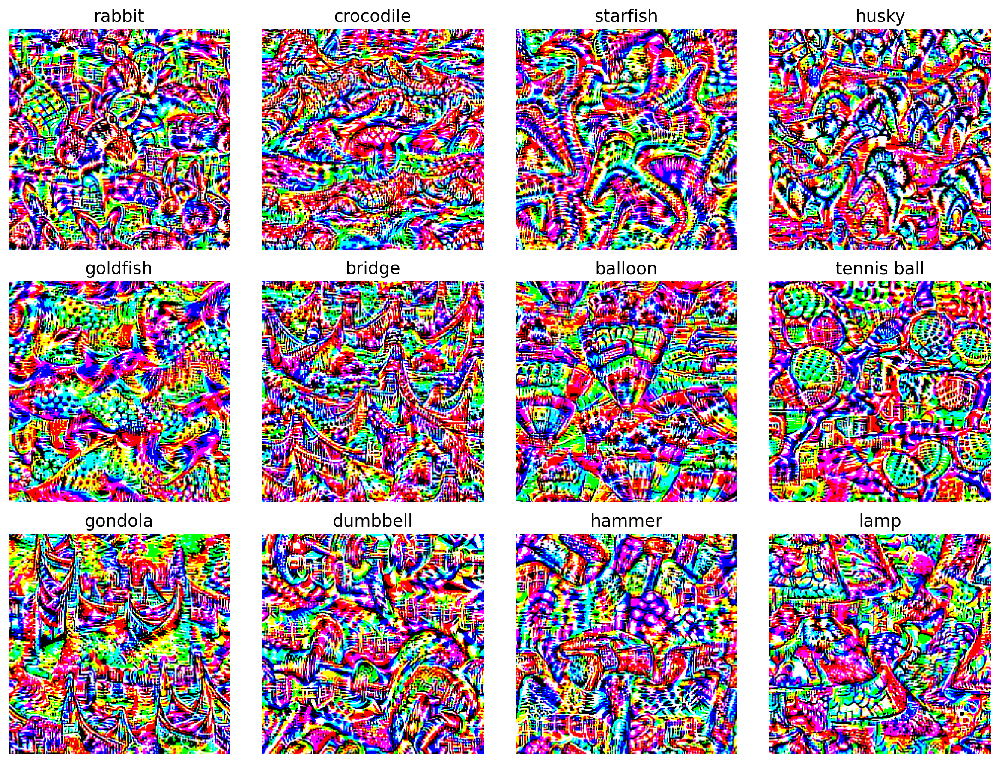

In [28]:
model = VGG16(weights='imagenet', include_top=True)

# Modificar el modelo para que las capas de salida sean lineales
model_modifier = ReplaceToLinear()

# Inicializar la técnica de maximización de activación
activation_maximization = ActivationMaximization(model, model_modifier=model_modifier)

# Definir las categorías y sus códigos
categories = [
    ('rabbit', 330),
    ('crocodile', 49),
    ('starfish', 327),
    ('husky', 248),
    ('goldfish', 1),
    ('bridge', 839),
    ('balloon', 417),
    ('tennis ball', 852),
    ('gondola', 576),
    ('dumbbell', 543),
    ('hammer', 587),
    ('lamp', 846)
]

# Crear una figura para mostrar todas las imágenes
fig, axs = plt.subplots(3, 4, figsize=(12, 9))
axs = axs.flatten()

# Iterar sobre cada categoría y generar una imagen
for i, (category, code) in enumerate(categories):
    # Definir la puntuación para la categoría actual
    score = CategoricalScore([code])

    # Generar la imagen que maximiza la activación para la categoría
    seed_input = np.random.random((1, 224, 224, 3))
    img = activation_maximization(score, seed_input=seed_input, input_modifiers=[Jitter(16)])

    # Mostrar la imagen en el subplot correspondiente
    axs[i].imshow(img[0])
    axs[i].set_title(category)
    axs[i].axis('off')

plt.tight_layout()
plt.show()

# Visualizing Convnet Filters

Vis Images en el índice 0: 8 imágenes.
Vis Images en el índice 1: 8 imágenes.
Vis Images en el índice 2: 8 imágenes.
Vis Images en el índice 3: 8 imágenes.
Vis Images en el índice 4: 8 imágenes.
Tamaño de la imagen stitched: (448, 896, 3)


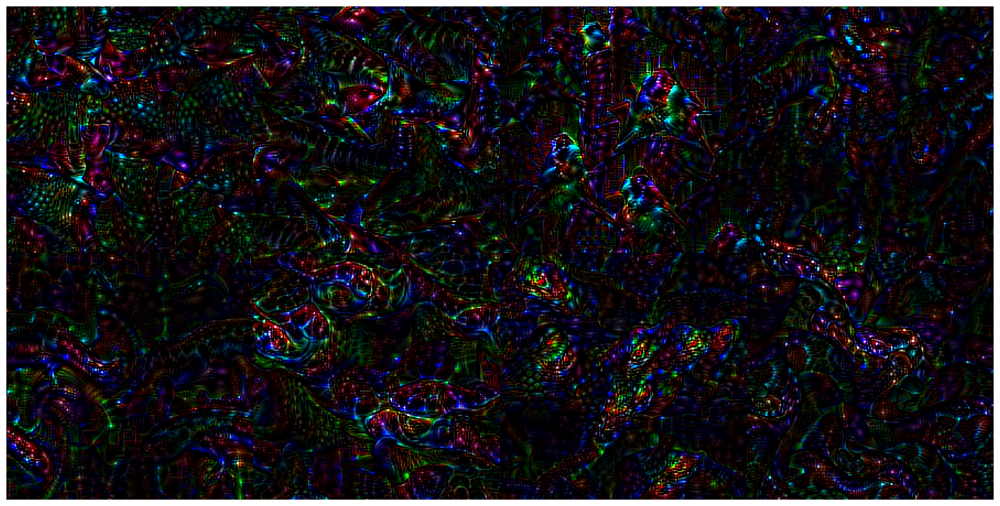

Tamaño de la imagen stitched: (448, 896, 3)


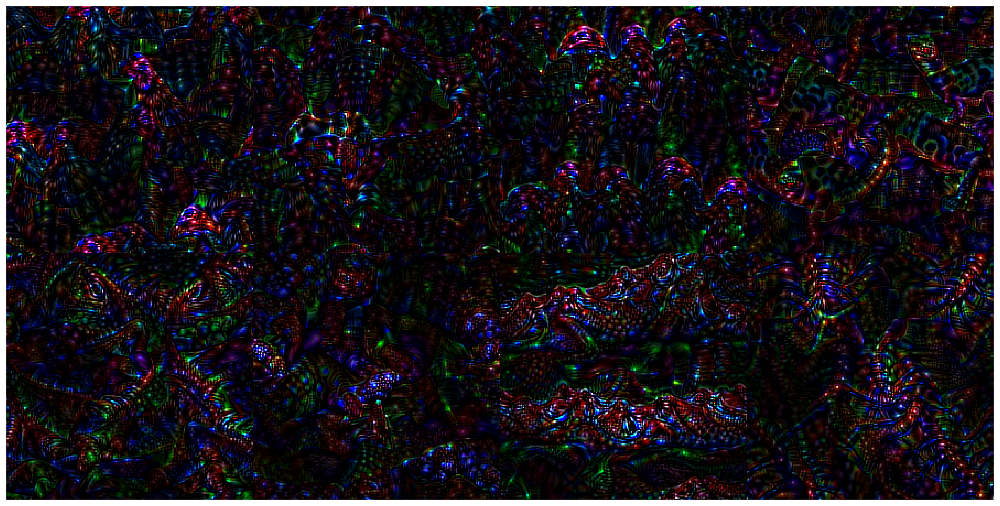

Tamaño de la imagen stitched: (448, 896, 3)


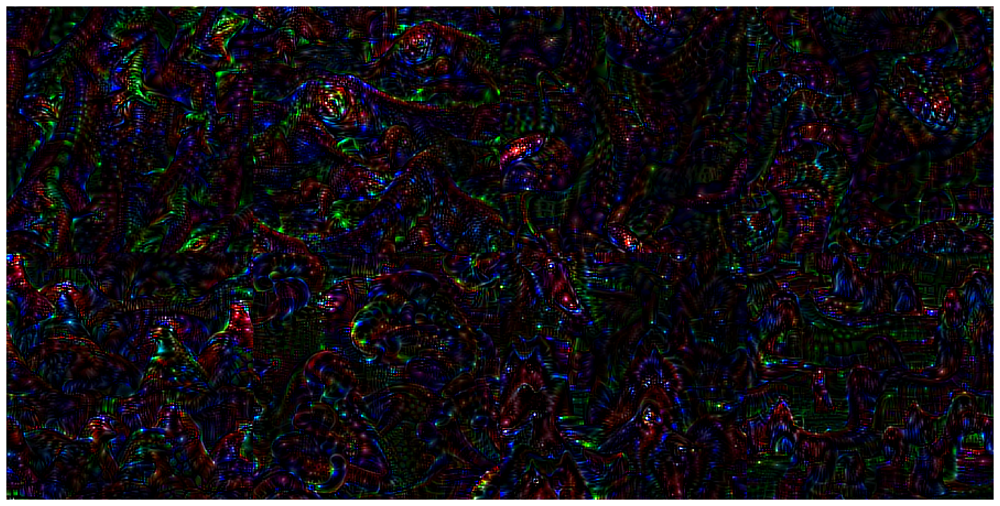

Tamaño de la imagen stitched: (448, 896, 3)


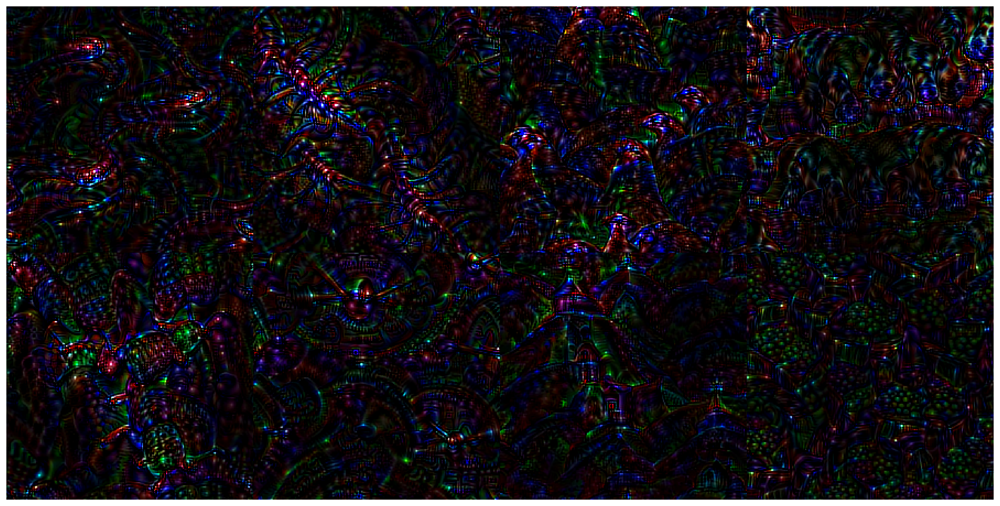

Tamaño de la imagen stitched: (448, 896, 3)


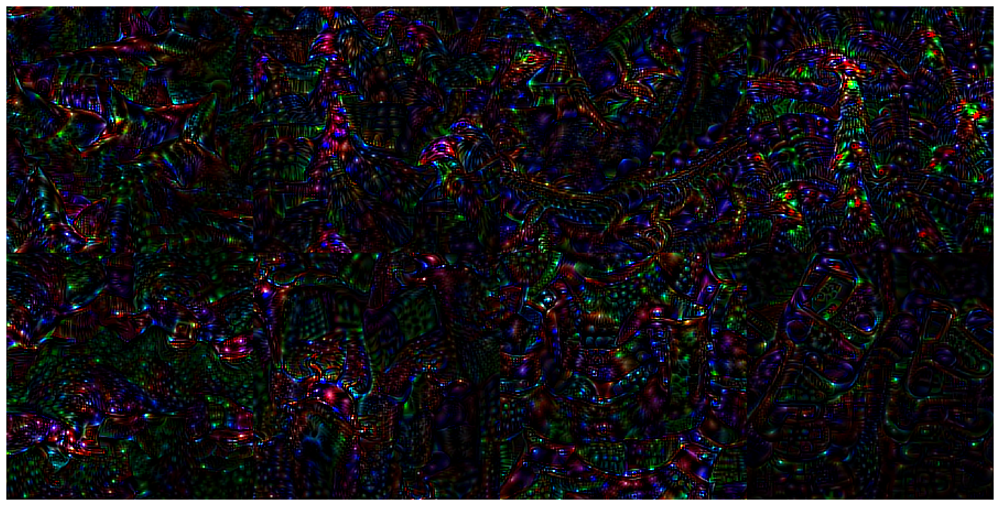

In [41]:
def find_layer_idx(model, layer_name):
    for i, layer in enumerate(model.layers):
        if layer.name == layer_name:
            return i
    raise ValueError(f"Layer {layer_name} not found in the model.")

# Función para obtener el número de filtros en una capa
def get_num_filters(layer):
    return layer.filters

# Función para visualizar la activación
def visualize_activation(model, layer_idx, filter_indices, tv_weight=0., input_modifiers=[], max_iter=300):
    activation_maximization = ActivationMaximization(
        model,
        model_modifier=ReplaceToLinear(),
        clone=False
    )
    score = CategoricalScore(filter_indices)
    return activation_maximization(
        score,
        seed_input=np.random.random((1, 224, 224, 3)),
        input_modifiers=input_modifiers
    )

# Configuración inicial
max_filters = 40
selected_indices = []
vis_images = [[], [], [], [], []]
i = 0

selected_filters = [
    [0, 3, 11, 25, 26, 33, 42, 62],
    [8, 21, 23, 38, 39, 45, 50, 79],
    [40, 48, 52, 54, 81, 107, 224, 226],
    [58, 79, 86, 216, 307, 426, 497, 509],
    [2, 7, 41, 84, 103, 306, 461, 487]
]

# Cargar el modelo VGG16 preentrenado
model = VGG16(weights='imagenet', include_top=True)

for layer_name in ['block1_conv2', 'block2_conv2', 'block3_conv3', 'block4_conv3', 'block5_conv3']:
    layer_idx = find_layer_idx(model, layer_name)

    # Seleccionar filtros
    if selected_filters:
        filters = selected_filters[i]
    else:
        filters = sorted(np.random.permutation(get_num_filters(model.layers[layer_idx]))[:max_filters])
    selected_indices.append(filters)

    # Generar la imagen de entrada para cada filtro
    for idx in filters:
        try:
            img = visualize_activation(model, layer_idx, filter_indices=idx, tv_weight=0.,
                                       input_modifiers=[Jitter(10)], max_iter=300)  # Ajustar Jitter a un valor positivo
            if img is not None:
                vis_images[i].append(img)
            else:
                print(f"Imagen para el filtro {idx} es None.")
        except Exception as e:
            print(f"Error al visualizar el filtro {idx}: {e}")

    # Verificar el contenido de vis_images[i]
    print(f"Vis Images en el índice {i}: {len(vis_images[i])} imágenes.")

    i += 1

# Mostrar las imágenes generadas
i = 0
while i < len(vis_images):
    if not vis_images[i]:
        print(f"No hay imágenes para el índice {i}.")
        i += 1
        continue

    num_images = len(vis_images[i])
    images_per_row = 4
    rows = (num_images + images_per_row - 1) // images_per_row

    # Obtener el tamaño de la primera imagen y verificar dimensiones
    first_image_shape = vis_images[i][0].shape
    if len(first_image_shape) == 3:
        img_height, img_width, img_channels = first_image_shape
        stitched = np.zeros((rows * img_height, images_per_row * img_width, img_channels), dtype=np.uint8)
    elif len(first_image_shape) == 4:
        # Manejar casos donde las imágenes tienen un batch dimension adicional
        img_height, img_width, img_channels = first_image_shape[1:]  # Suponiendo (batch_size, height, width, channels)
        stitched = np.zeros((rows * img_height, images_per_row * img_width, img_channels), dtype=np.uint8)
    else:
        raise ValueError(f"Unexpected image shape: {first_image_shape}")

    for j in range(num_images):
        row = j // images_per_row
        col = j % images_per_row
        stitched[row * img_height:(row + 1) * img_height,
                 col * img_width:(col + 1) * img_width] = vis_images[i][j]

    print(f"Tamaño de la imagen stitched: {stitched.shape}")

    plt.figure(figsize=(20, 30))
    plt.axis('off')
    plt.imshow(stitched)
    plt.show()
    i += 1